<h1>Prototyp Data Input</h1>
Erstellt am 12.04.2022 von Christian T. Seidler
<br>Zweck: Einlesen und grafische Darstellung der wichtigsten Signalparameter aller Bearings des FEMTO Bearing Data Sets.

In [26]:
import numpy as np
import pandas as pd
from scipy.stats import entropy

import matplotlib.pyplot as plt
import time
import os

In [27]:
# Datenpfad anlegen
path = r'/Users/samueldittmann/Desktop/Studium/ML in Manufacturing/Projekt.nosync/Datensatz/'

learning_sets = {'Bearing1_1': 2803,
                 'Bearing1_2': 871,
                 'Bearing2_1': 911,
                 'Bearing2_2': 797,
                 'Bearing3_1': 515,
                 'Bearing3_2': 1637}

test_sets = {'Bearing1_3': 1802,
             'Bearing1_4': 1139,
             'Bearing1_5': 2302,
             'Bearing1_6': 2302,
             'Bearing1_7': 1502,
             'Bearing2_3': 1202,
             'Bearing2_4': 612,
             'Bearing2_5': 2002,
             'Bearing2_6': 572,
             'Bearing2_7': 172,
             'Bearing3_3': 352}

In [28]:
# Funktion, um eine Messung einzulesen und als pd.Dataframe zurückzugeben
def read_single_measurement(filepath):
    # Nur die letzten beiden Spalten einlesen, da diese die Messdaten in x- und y-Richtung enthalten
    measurement = pd.read_csv(filepath, sep=',', header=None, usecols=[4, 5])
    
    # Header umbenennen
    measurement.rename(columns={4: 'acc_x', 5: 'acc_y'}, inplace=True)
    
    return measurement

In [44]:
# Funktion, um aus den Messdaten die interessanten Informationen zu extrahieren
def calc_signal_params(data):
    cols = ['acc_x', 'acc_y']
    
    # Mittelwert
    mean_x, mean_y = data[cols].mean()
    
    # Absoluter Mittelwert
    abs_mean_x, abs_mean_y = data[cols].abs().mean()

    # Gleitender Mittelwert
    moving_mean_x, moving_mean_y = data[cols].rolling(window=640).mean().iloc[-1].values
    
    # Standardabweichung
    std_x, std_y = data[cols].std()
    
    # Schiefe - Skew
    skew_x, skew_y = data[cols].skew()
    
    # Kurtosis
    kurtosis_x, kurtosis_y = data[cols].kurtosis()

    # RMS
    rms_x, rms_y = np.sqrt((data[cols]**2).sum() / len(data[cols]))
    
    # Absoluter maximaler Wert
    abs_max_x, abs_max_y = data[cols].abs().max()
    
    # Amplitude - Peak-to-Peak
    p2p_x, p2p_y = data[cols].abs().max() - data[cols].abs().min()
    
    # Crest Faktor
    crest_x = abs_max_x / rms_x
    crest_y = abs_max_y / rms_y
    
    # Shape Faktor
    shape_x = rms_x / abs_mean_x
    shape_y = rms_y / abs_mean_y
    
    # Impulse
    impulse_x = abs_max_x / abs_mean_x
    impulse_y = abs_max_y / abs_mean_y
        
    # Clearance Faktor
    clearance_x, clearance_y = ((np.sqrt(data[cols].abs())).sum() / len(data[cols]))**2
    
    # Entropie einfügen
    entropy_x = entropy(pd.cut(data[cols[0]], 500).value_counts())
    entropy_y = entropy(pd.cut(data[cols[1]], 500).value_counts())
    
    # DataFrame aufbauen
    signal_params = pd.DataFrame({'mean_acc_x': [], 'mean_acc_y': [],
                                  'abs_mean_x': [], 'abs_mean_y': [],
                                  'moving_mean_x': [], 'moving_mean_y': [],
                                  'std_x': [], 'std_y': [],
                                  'skew_x': [], 'skew_y': [],
                                  'kurtosis_x': [], 'kurtosis_y': [],
                                  'rms_x': [], 'rms_y': [],
                                  'abs_max_x': [], 'abs_max_y': [],
                                  'p2p_x': [], 'p2p_y': [],
                                  'crest_x': [], 'crest_y': [],
                                  'shape_x': [], 'shape_y':[],
                                  'impulse_x': [], 'impulse_y': [],
                                  'clearance_x': [], 'clearance_y': [],
                                  'entropy_x': [], 'entropy_y': []})
    
    # DataFrame mit berechneten Parametern befüllen
    signal_params.loc[0] = [mean_x, mean_y, abs_mean_x, abs_mean_y, moving_mean_x, moving_mean_y, std_x, std_y,
                            skew_x, skew_y, kurtosis_x, kurtosis_y, rms_x, rms_y,
                            abs_max_x, abs_max_y, p2p_x, p2p_y, crest_x, crest_y,
                            shape_x, shape_y, impulse_x, impulse_y, clearance_x, clearance_y,
                            entropy_x, entropy_y]
    
    return signal_params

In [30]:
# Funktion, um automatisiert alle Messungen einzulesen
def read_bearing_measurements(filepath, start=1, end=1, step=1):
    data = pd.DataFrame()
    
    # Filepath automatisiert anpassen
    for i in range(start, end+1, step):
        if i < 10:
            document = r'/acc_0000' + str(i) + '.csv'
        elif 10 <= i < 100:
            document = r'/acc_000' + str(i) + '.csv'
        elif 100 <= i < 1000:
            document = r'/acc_00' + str(i) + '.csv'
        else:
            document = r'/acc_0' + str(i) + '.csv'
            
        path = filepath + document

        # Messdaten einlesen
        input_df = read_single_measurement(path)
        
        # Extrahieren der Signalinformationen aus den Messdaten
        signal_params = calc_signal_params(input_df)
        
        # Anhängen der Daten an den DataFrame
        data = pd.concat([data, signal_params], ignore_index=True)
        
    return data    

In [31]:
# Funktion, um grundlegende Informationen eines Dataframes auszugeben
def print_df_infos(df):
    print(df.describe(), end='\n\n')
    print(df.head(), end='\n\n')
    print(df.tail(), end='\n\n')
    print(df.info(), end='\n\n')

In [32]:
# Funktion, um die berechneten Signalparameter grafisch anzuzeigen
def plot_signal_params(df, figsize=(26, 27)):
    fig, axes = plt.subplots(nrows=14, ncols=1, figsize=figsize, sharex=True)

    # Bearing 1_1
    df.plot(y=[0, 1], ax=axes[0], title='Mittelwert')
    df.plot(y=[2, 3], ax=axes[1], title='Absoluter Mittelwert')
    df.plot(y=[4, 5], ax=axes[2], title='Gleitender Mittelwert')
    df.plot(y=[6, 7], ax=axes[3], title='Standardabweichung')
    df.plot(y=[6, 9], ax=axes[4], title='Schiefe')
    df.plot(y=[10, 11], ax=axes[5], title='Kurtosis')
    df.plot(y=[12, 13], ax=axes[6], title='RMS')
    df.plot(y=[14, 15], ax=axes[7], title='Absoluter maximaler Wert')
    df.plot(y=[16, 17], ax=axes[8], title='Amplitude - peak-to-peak')
    df.plot(y=[18, 19], ax=axes[9], title='Crest-Faktor')
    df.plot(y=[20, 21], ax=axes[10], title='Shape-Faktor')
    df.plot(y=[22, 23], ax=axes[11], title='Impuls')
    df.plot(y=[24, 25], ax=axes[12], title='Clearance-Faktor')
    df.plot(y=[26, 27], ax=axes[13], title='Entropie')

    plt.show()

<h3>Condition 1</h3>

<h5>Bearing 1_1 (Lernset)</h5>

In [45]:
file = os.path.join(path, 'Learning_set', 'Bearing1_1')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing1_1'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 180.84389877319336

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  2803.000000  2803.000000  2803.000000  2803.000000    2803.000000   
mean      0.001169     0.000950     0.505178     0.372544       0.000579   
std       0.012597     0.023840     0.361266     0.214666       0.022193   
min      -0.279888    -0.507520     0.233700     0.253855      -0.268011   
25%      -0.004312    -0.007811     0.280246     0.291906      -0.011072   
50%       0.001230     0.001316     0.381663     0.338188       0.000853   
75%       0.007040     0.010894     0.627544     0.382710       0.013302   
max       0.141195     0.228236     3.937015     3.391389       0.150125   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    2803.000000  2803.000000  2803.000000  2803.000000  2803.000000  ...   
mean        0.001164     0.676364     0.479034    -0.091141    -0.053088  ...   
std         0.024772     0.56514

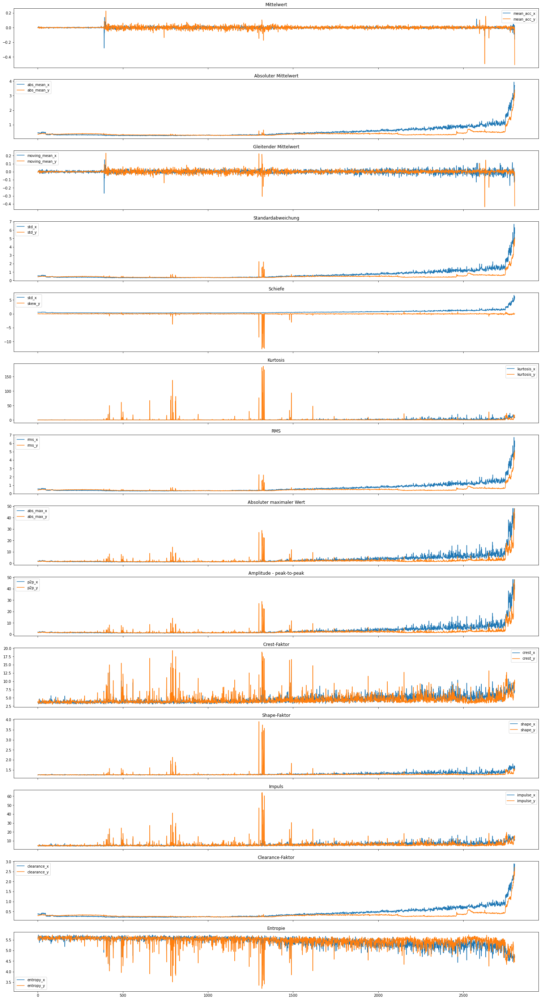

In [47]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 1_2 (Lernset)</h5>

In [48]:
file = os.path.join(path, 'Learning_set', 'Bearing1_2')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing1_2'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 51.9805691242218

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  871.000000  871.000000  871.000000  871.000000     871.000000   
mean     0.000647    0.002405    0.294408    0.441110       0.000696   
std      0.028284    0.021955    0.165515    0.264844       0.030552   
min     -0.145548   -0.067641    0.215814    0.320244      -0.137670   
25%     -0.017090   -0.011267    0.240092    0.348424      -0.018005   
50%      0.000662    0.002686    0.256160    0.382488       0.001975   
75%      0.016835    0.016303    0.274337    0.422266       0.019698   
max      0.157293    0.066767    1.539368    2.947015       0.160623   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     871.000000  871.000000  871.000000  871.000000  871.000000  ...   
mean        0.002389    0.392688    0.642759   -0.350435   -0.070776  ...   
std         0.023081    0.231425    0.386694    0.679643    1.414933  ...   
min  

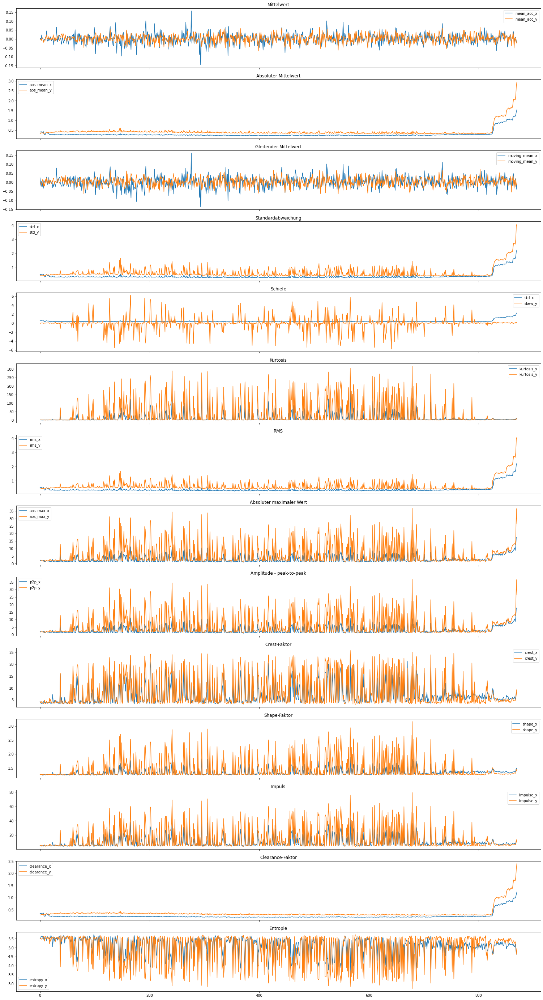

In [50]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 1_3 (Testset)</h5>

In [51]:
file = os.path.join(path, 'Test_set', 'Bearing1_3')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_3'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 119.85707211494446

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  1802.000000  1802.000000  1802.000000  1802.000000    1802.000000   
mean      0.001338     0.002399     0.341162     0.307710       0.001188   
std       0.023026     0.073138     0.098487     0.206173       0.025847   
min      -0.117759    -1.009009     0.251545     0.224877      -0.115367   
25%      -0.013631    -0.015066     0.281029     0.250375      -0.015481   
50%       0.002230     0.001622     0.298688     0.274034       0.000937   
75%       0.016413     0.019682     0.357242     0.298865       0.018357   
max       0.100530     1.098846     0.945489     3.837162       0.098536   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    1802.000000  1802.000000  1802.000000  1802.000000  1802.000000  ...   
mean        0.004287     0.434449     0.435956    -0.058692    -0.435791  ...   
std         0.115427     0.13417

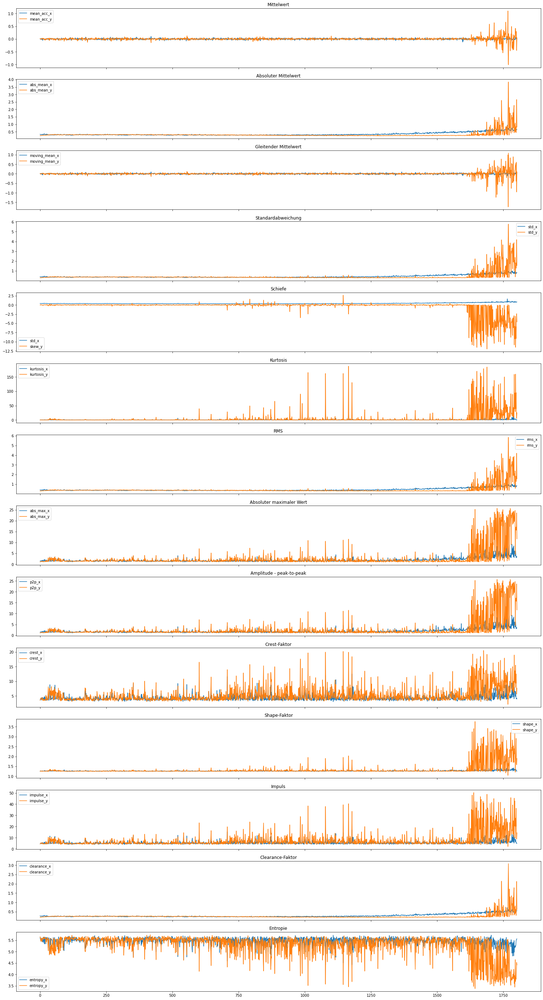

In [52]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 1_4 (Testset)</h5>

In [53]:
file = os.path.join(path, 'Test_set', 'Bearing1_4')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_4'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 69.09509921073914

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  1139.000000  1139.000000  1139.000000  1139.000000    1139.000000   
mean      0.001290     0.000916     0.361623     0.518126       0.001247   
std       0.016575     0.019771     0.261548     0.334898       0.019662   
min      -0.080755    -0.204734     0.264945     0.359185      -0.094919   
25%      -0.009297    -0.010759     0.292412     0.415473      -0.011594   
50%       0.001704     0.000568     0.306127     0.446862       0.001381   
75%       0.012173     0.012062     0.323913     0.493268       0.014262   
max       0.059528     0.099792     2.142691     2.955289       0.072677   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    1139.000000  1139.000000  1139.000000  1139.000000  1139.000000  ...   
mean        0.000893     0.461259     0.655095    -0.019928    -0.002692  ...   
std         0.020840     0.361665

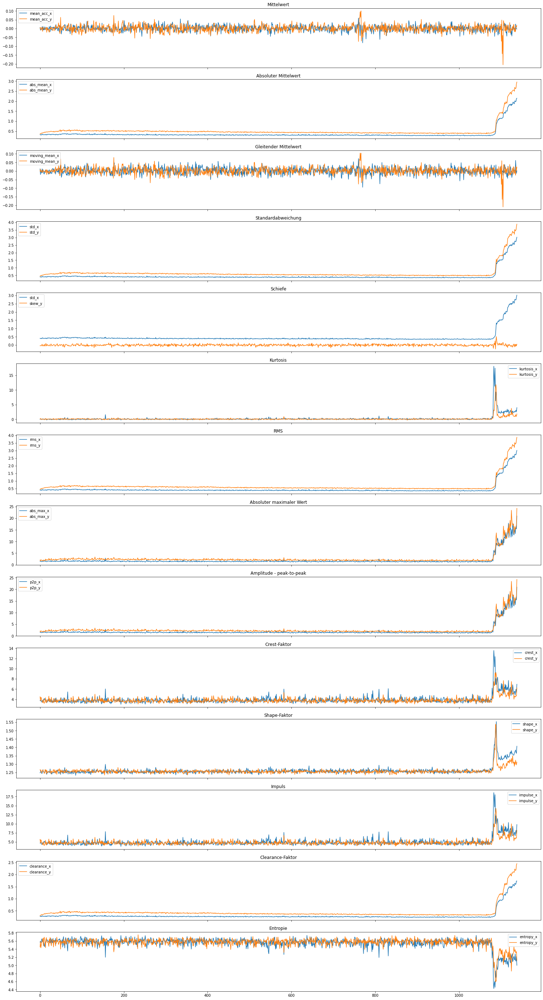

In [54]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 1_5 (Testset)</h5>

In [55]:
file = os.path.join(path, 'Test_set', 'Bearing1_5')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_5'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 141.14204478263855

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  2302.000000  2302.000000  2302.000000  2302.000000    2302.000000   
mean      0.001897     0.001712     0.227165     0.355279       0.001192   
std       0.022227     0.014351     0.028438     0.030773       0.025118   
min      -0.092540    -0.071348     0.188460     0.285918      -0.085956   
25%      -0.011931    -0.007610     0.205621     0.332547      -0.015801   
50%       0.001837     0.001772     0.216590     0.344958       0.001010   
75%       0.015118     0.011087     0.242222     0.371728       0.017675   
max       0.090289     0.060324     0.331138     0.468571       0.094072   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    2302.000000  2302.000000  2302.000000  2302.000000  2302.000000  ...   
mean        0.001739     0.285381     0.445989    -0.012094     0.008203  ...   
std         0.016604     0.03563

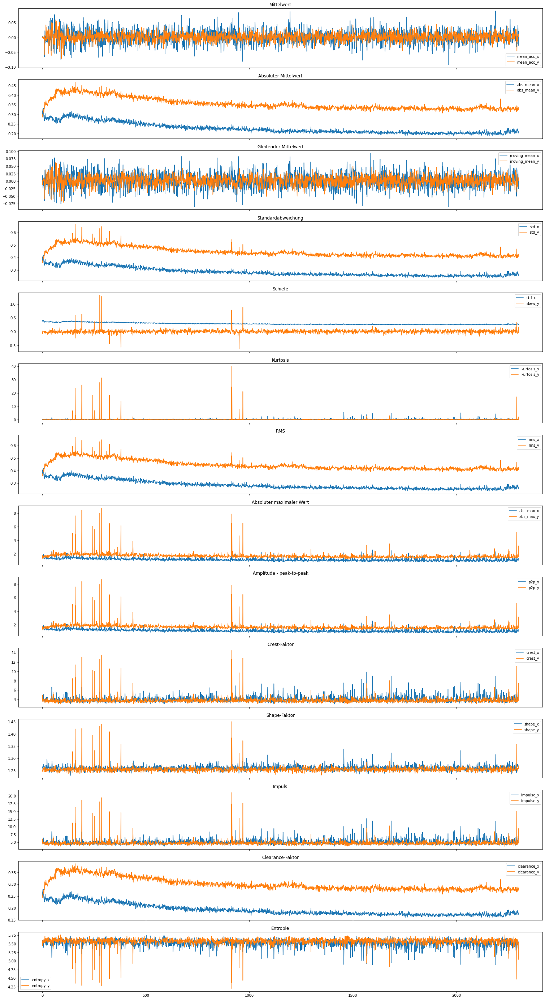

In [56]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 1_6 (Testset)</h5>

In [57]:
file = os.path.join(path, 'Test_set', 'Bearing1_6')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_6'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 140.97754406929016

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  2302.000000  2302.000000  2302.000000  2302.000000    2302.000000   
mean      0.001039     0.001982     0.284167     0.322720       0.000827   
std       0.017563     0.024332     0.035180     0.038372       0.023240   
min      -0.066064    -0.098398     0.220761     0.266991      -0.084142   
25%      -0.010976    -0.013378     0.260561     0.295470      -0.015272   
50%       0.001213     0.001562     0.275118     0.307589       0.000622   
75%       0.013140     0.017635     0.301300     0.341290       0.017120   
max       0.054985     0.086150     0.519092     0.479879       0.072306   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    2302.000000  2302.000000  2302.000000  2302.000000  2302.000000  ...   
mean        0.002092     0.370317     0.412976    -0.029271     0.036417  ...   
std         0.025496     0.05766

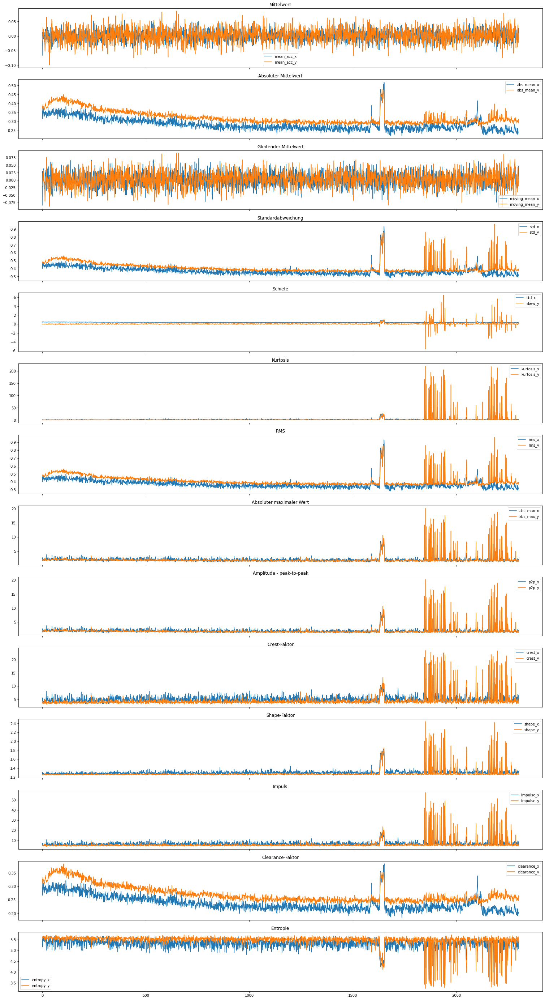

In [58]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 1_7 (Testset)</h5>

In [59]:
file = os.path.join(path, 'Test_set', 'Bearing1_7')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_7'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 88.95356822013855

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  1502.000000  1502.000000  1502.000000  1502.000000    1502.000000   
mean      0.001359     0.000921     0.282665     0.356656       0.001569   
std       0.015635     0.031919     0.033498     0.030219       0.019771   
min      -0.318675    -0.170827     0.226617     0.299445      -0.294367   
25%      -0.006708    -0.018660     0.255281     0.330011      -0.010704   
50%       0.001365     0.002355     0.279583     0.355408       0.000998   
75%       0.010012     0.022127     0.303973     0.385630       0.013912   
max       0.096773     0.117941     0.560804     0.451141       0.099919   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    1502.000000  1502.000000  1502.000000  1502.000000  1502.000000  ...   
mean        0.000520     0.359761     0.454902     0.000154    -0.017001  ...   
std         0.032557     0.043649

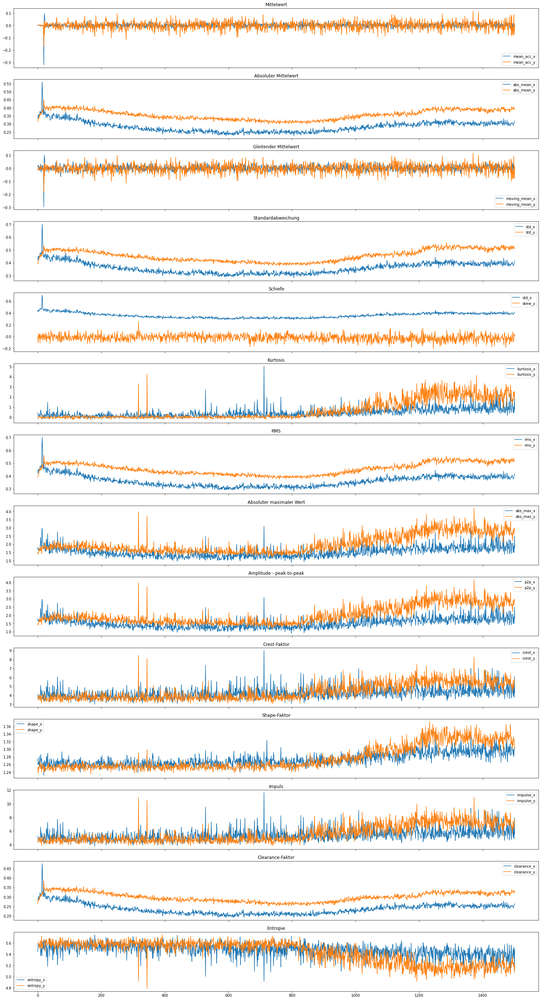

In [60]:
plot_signal_params(data, figsize=(26, 50))

<h3>Condition 2</h3>

<h5>Bearing 2_1 (Lernset)</h5>

In [61]:
file = os.path.join(path, 'Learning_set', 'Bearing2_1')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing2_1'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 51.68871808052063

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  911.000000  911.000000  911.000000  911.000000     911.000000   
mean     0.001529    0.001418    0.486402    0.579867       0.001864   
std      0.015025    0.011519    0.137626    0.209834       0.019749   
min     -0.051372   -0.040734    0.031237    0.050918      -0.101097   
25%     -0.008700   -0.006773    0.445561    0.554218      -0.010828   
50%      0.002014    0.001381    0.475259    0.601577       0.002330   
75%      0.011835    0.009403    0.518232    0.651217       0.015142   
max      0.046592    0.041217    1.654483    1.806759       0.062872   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     911.000000  911.000000  911.000000  911.000000  911.000000  ...   
mean        0.001149    0.621645    0.744432   -0.055762   -0.001661  ...   
std         0.012573    0.201459    0.274095    0.119216    0.165378  ...   
min 

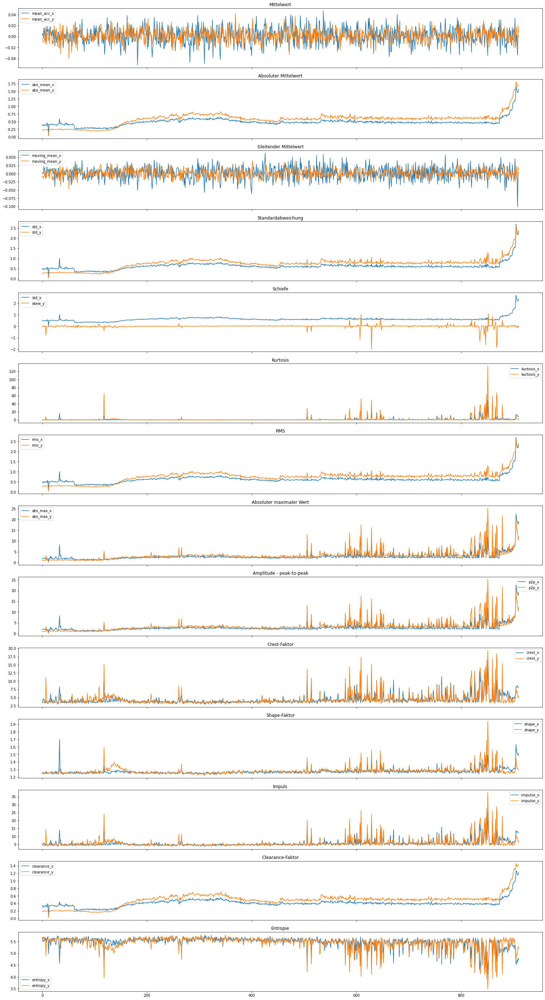

In [62]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 2_2 (Lernset)</h5>

In [63]:
file = os.path.join(path, 'Learning_set', 'Bearing2_2')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing2_2'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 47.396326780319214

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  797.000000  797.000000  797.000000  797.000000     797.000000   
mean     0.001368    0.000604    0.449689    0.661523       0.001797   
std      0.017819    0.037876    0.157275    0.298653       0.025056   
min     -0.157602   -0.181074    0.201702    0.152927      -0.375416   
25%     -0.008478   -0.022891    0.288923    0.378532      -0.008858   
50%      0.001788    0.000843    0.453707    0.661557       0.002172   
75%      0.011323    0.022943    0.547717    0.871433       0.013809   
max      0.109990    0.138955    1.269656    1.724104       0.179622   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     797.000000  797.000000  797.000000  797.000000  797.000000  ...   
mean        0.000558    0.578620    0.857950   -0.106586    0.013543  ...   
std         0.038208    0.218080    0.392728    0.255628    0.047724  ...   
min

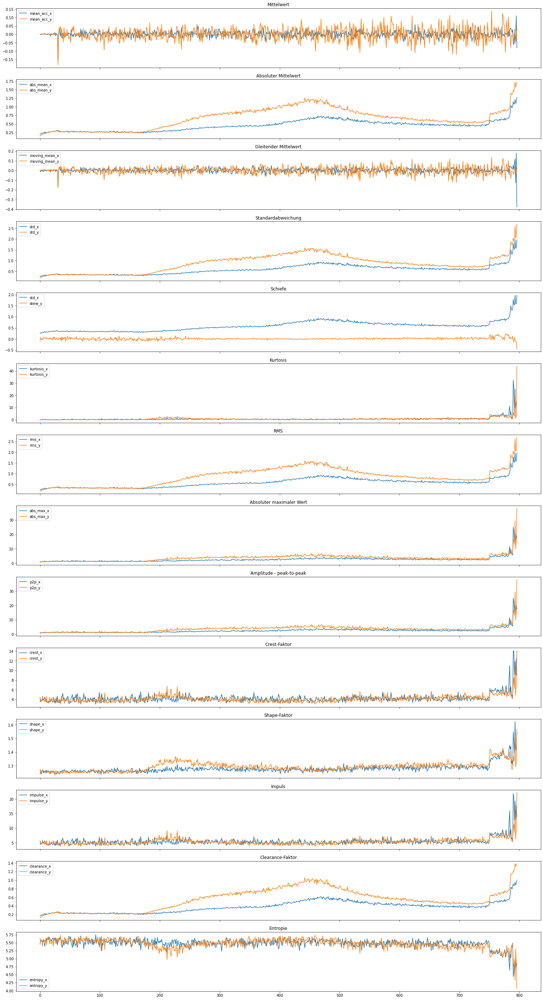

In [64]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 2_3 (Testset)</h5>

In [65]:
file = os.path.join(path, 'Test_set', 'Bearing2_3')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_3'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 71.30464792251587

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  1202.000000  1202.000000  1202.000000  1202.000000    1202.000000   
mean      0.001351     0.001531     0.275764     0.239383       0.001470   
std       0.009010     0.013081     0.084452     0.044175       0.014486   
min      -0.025892    -0.051749     0.187824     0.194805      -0.040248   
25%      -0.004192    -0.005153     0.212071     0.216810      -0.008758   
50%       0.001404     0.001237     0.230107     0.227251       0.001364   
75%       0.006906     0.008021     0.336031     0.245533       0.011131   
max       0.116197     0.167738     0.524716     0.491130       0.123667   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    1202.000000  1202.000000  1202.000000  1202.000000  1202.000000  ...   
mean        0.001568     0.365283     0.374666     0.007918    -0.223066  ...   
std         0.013882     0.129177

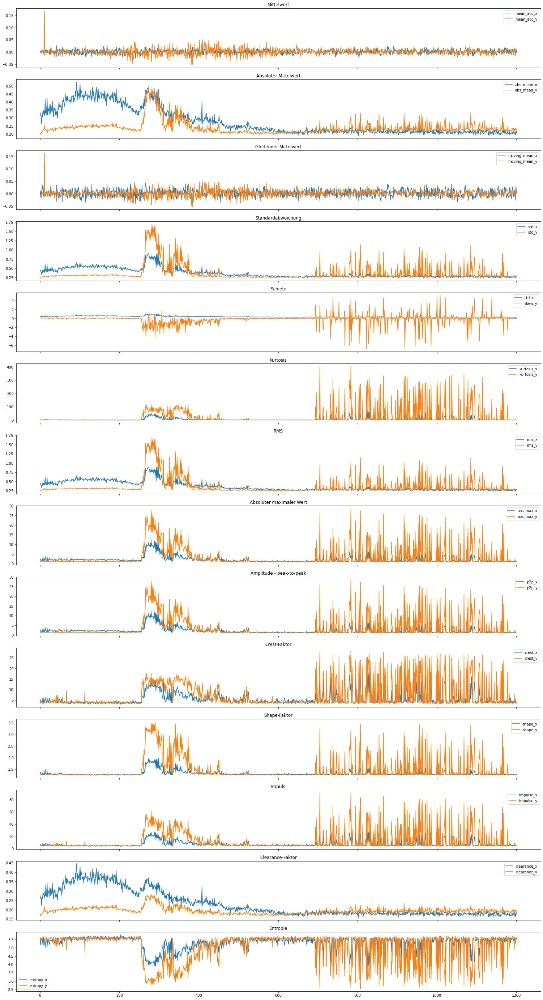

In [66]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 2_4 (Testset)</h5>

In [67]:
file = os.path.join(path, 'Test_set', 'Bearing2_4')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_4'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 37.2452552318573

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  612.000000  612.000000  612.000000  612.000000     612.000000   
mean     0.000698    0.001030    0.270086    0.228514       0.000674   
std      0.015642    0.007565    0.024567    0.010216       0.017651   
min     -0.052120   -0.021539    0.214305    0.191142      -0.058695   
25%     -0.008757   -0.003348    0.250234    0.221577      -0.010881   
50%      0.000406    0.001120    0.272093    0.229191       0.000197   
75%      0.009656    0.005631    0.287933    0.235076       0.012870   
max      0.062275    0.029363    0.386664    0.270695       0.066873   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     612.000000  612.000000  612.000000  612.000000  612.000000  ...   
mean        0.001176    0.342547    0.288813   -0.115057   -0.037496  ...   
std         0.008112    0.033676    0.017121    0.244104    0.078204  ...   
min  

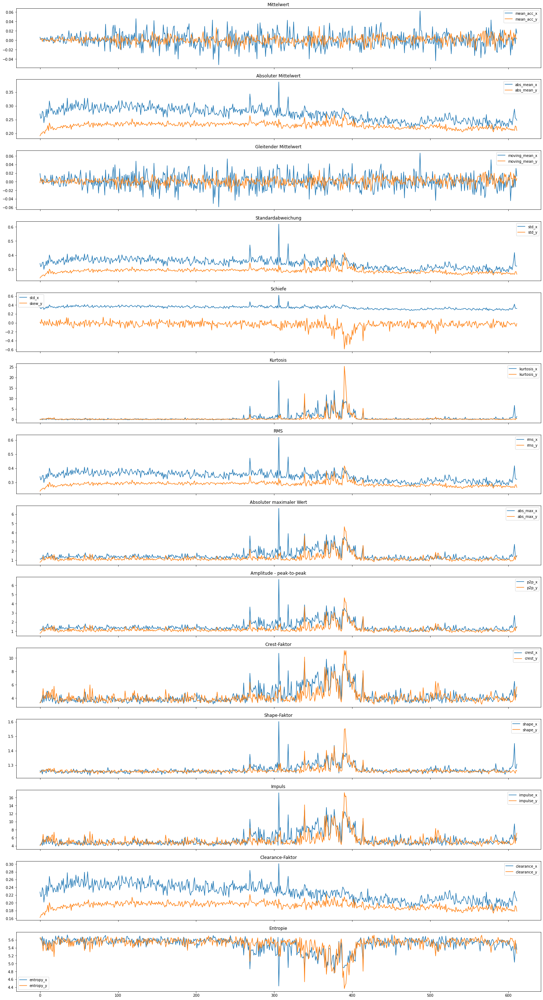

In [68]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 2_5 (Testset)</h5>

In [69]:
file = os.path.join(path, 'Test_set', 'Bearing2_5')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_5'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 117.8396098613739

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  2002.000000  2002.000000  2002.000000  2002.000000    2002.000000   
mean      0.001016     0.002088     0.287560     0.307856       0.001510   
std       0.030111     0.006979     0.125123     0.039921       0.038671   
min      -0.602544    -0.035668     0.194455     0.179776      -0.654961   
25%      -0.008212    -0.002073     0.221542     0.292140      -0.010535   
50%       0.001467     0.002174     0.234272     0.298144       0.002385   
75%       0.011674     0.006286     0.279899     0.306915       0.014561   
max       0.331489     0.025298     1.769630     0.512138       0.344878   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    2002.000000  2002.000000  2002.000000  2002.000000  2002.000000  ...   
mean        0.002092     0.364162     0.390850    -0.099812    -0.003156  ...   
std         0.008024     0.153389

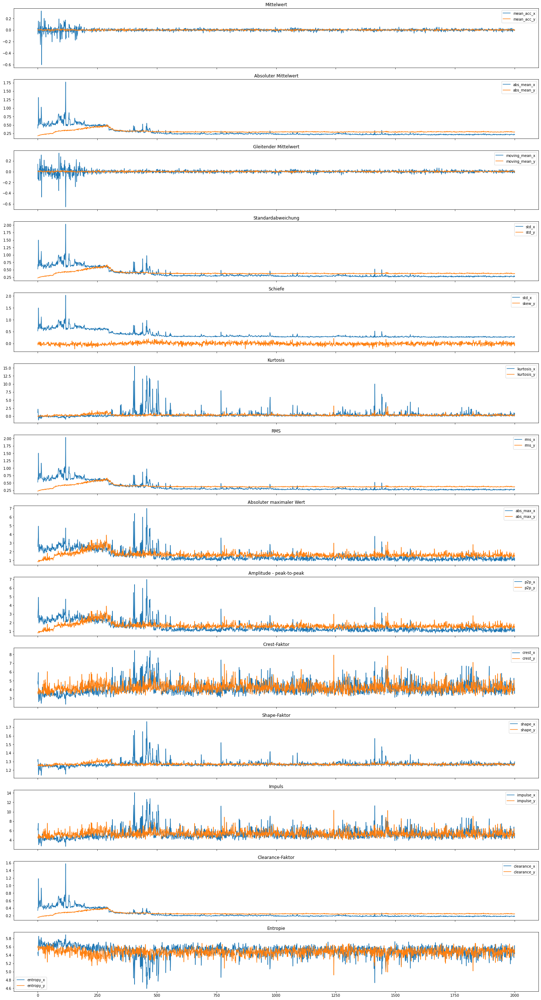

In [70]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 2_6 (Testset)</h5>

In [71]:
file = os.path.join(path, 'Test_set', 'Bearing2_6')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_6'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 35.18325090408325

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  572.000000  572.000000  572.000000  572.000000     572.000000   
mean     0.001432    0.001396    0.197454    0.266803       0.001843   
std      0.020882    0.005669    0.032070    0.014826       0.022223   
min     -0.065017   -0.012577    0.155820    0.236358      -0.069355   
25%     -0.011395   -0.001947    0.171939    0.254679      -0.013332   
50%      0.000728    0.001233    0.182144    0.263544       0.000895   
75%      0.014546    0.004547    0.227200    0.277416       0.014909   
max      0.120718    0.064133    0.281031    0.308313       0.095153   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     572.000000  572.000000  572.000000  572.000000  572.000000  ...   
mean        0.001424    0.247737    0.334925   -0.072552    0.010521  ...   
std         0.006979    0.040347    0.019615    0.064862    0.092263  ...   
min 

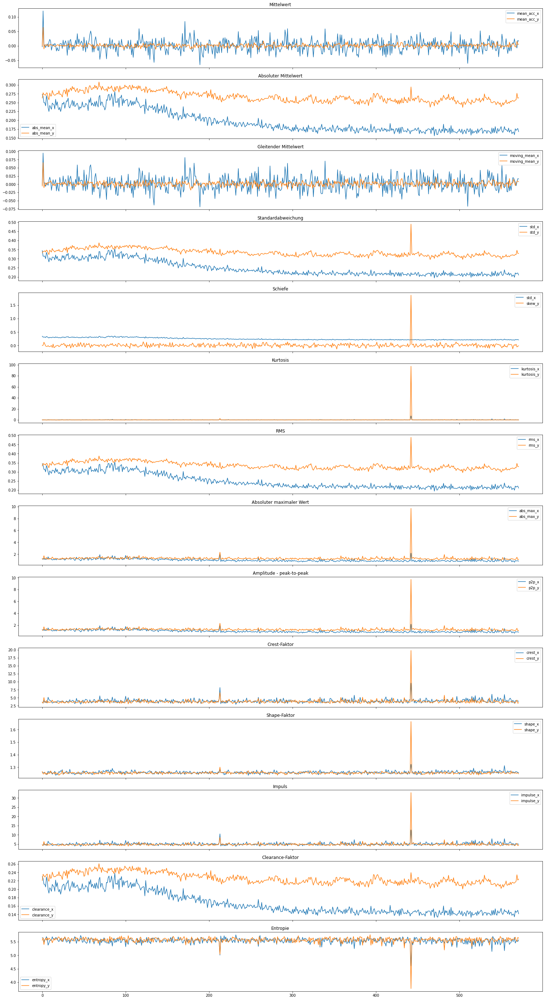

In [72]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 2_7 (Testset)</h5>

In [73]:
file = os.path.join(path, 'Test_set', 'Bearing2_7')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_7'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 10.632944822311401

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  172.000000  172.000000  172.000000  172.000000     172.000000   
mean    -0.001224    0.000166    0.274262    0.302116       0.001024   
std      0.012511    0.006974    0.019330    0.015196       0.022321   
min     -0.040854   -0.017537    0.239182    0.276061      -0.061587   
25%     -0.009054   -0.004601    0.261832    0.293134      -0.012088   
50%     -0.001347    0.000464    0.270906    0.299588       0.004472   
75%      0.006614    0.005285    0.282386    0.308606       0.017857   
max      0.036081    0.023558    0.335238    0.396446       0.043980   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     172.000000  172.000000  172.000000  172.000000  172.000000  ...   
mean       -0.001349    0.348023    0.392348   -0.077190   -0.036960  ...   
std         0.012350    0.027724    0.084269    0.108341    0.373900  ...   
min

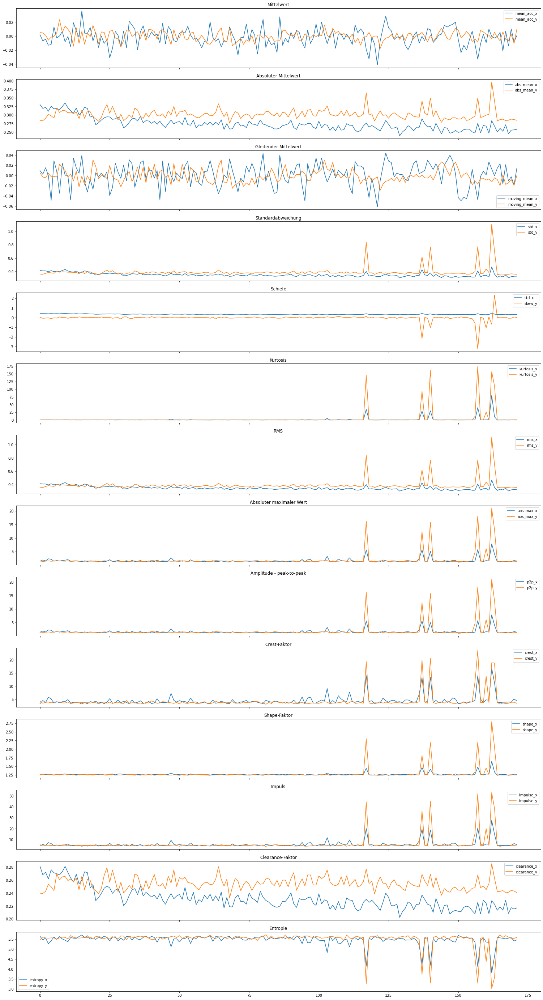

In [74]:
plot_signal_params(data, figsize=(26, 50))

<h3>Condition 3</h3>

<h5>Bearing 3_1 (Lernset)</h5>

In [75]:
file = os.path.join(path, 'Learning_set', 'Bearing3_1')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing3_1'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 30.667270183563232

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  515.000000  515.000000  515.000000  515.000000     515.000000   
mean     0.002554    0.001407    0.261587    0.280235       0.002783   
std      0.039295    0.023150    0.096867    0.174087       0.039276   
min     -0.259387   -0.043793    0.177279    0.211002      -0.099980   
25%     -0.012038   -0.006276    0.221504    0.235380      -0.014341   
50%      0.001576    0.000519    0.234017    0.245458       0.002145   
75%      0.014329    0.006764    0.252721    0.254236       0.016865   
max      0.652714    0.433591    0.781998    1.200605       0.654092   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     515.000000  515.000000  515.000000  515.000000  515.000000  ...   
mean        0.001050    0.344219    0.358262   -0.008343   -0.022528  ...   
std         0.025763    0.153451    0.231858    0.943923    0.176228  ...   
min

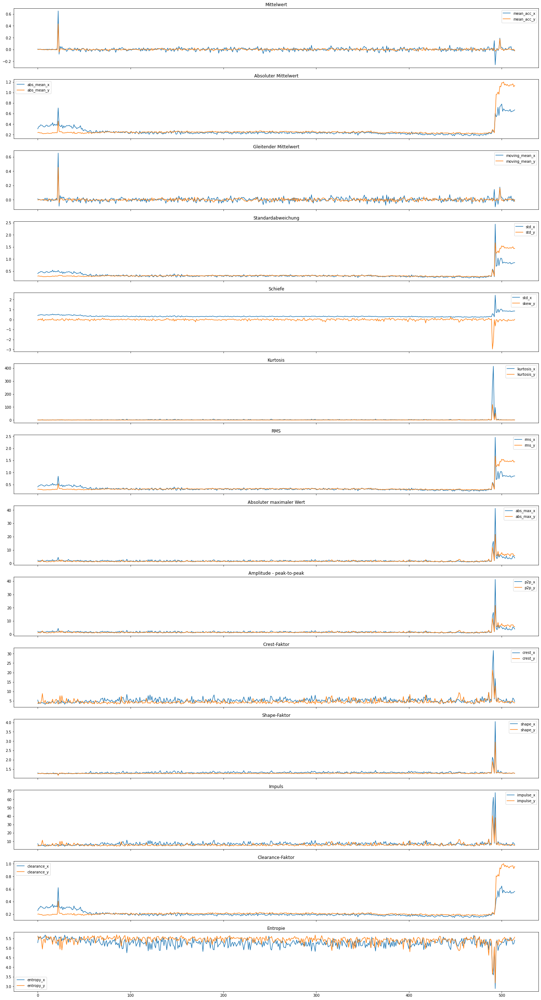

In [76]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 3_2 (Lernset)</h5>

In [77]:
file = os.path.join(path, 'Learning_set', 'Bearing3_2')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing3_2'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 97.70911478996277

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y  moving_mean_x  \
count  1637.000000  1637.000000  1637.000000  1637.000000    1637.000000   
mean      0.001202     0.000836     0.248001     0.247874       0.001261   
std       0.020518     0.014014     0.095112     0.121872       0.023041   
min      -0.062380    -0.082077     0.041523     0.100171      -0.064177   
25%      -0.012155    -0.008148     0.218582     0.217156      -0.013423   
50%       0.000641     0.000741     0.231811     0.224087       0.000653   
75%       0.013503     0.009111     0.248652     0.237918       0.015547   
max       0.144030     0.102328     1.562205     1.727692       0.166850   

       moving_mean_y        std_x        std_y       skew_x       skew_y  ...  \
count    1637.000000  1637.000000  1637.000000  1637.000000  1637.000000  ...   
mean        0.000842     0.327356     0.320591    -0.104252    -0.011854  ...   
std         0.014879     0.142430

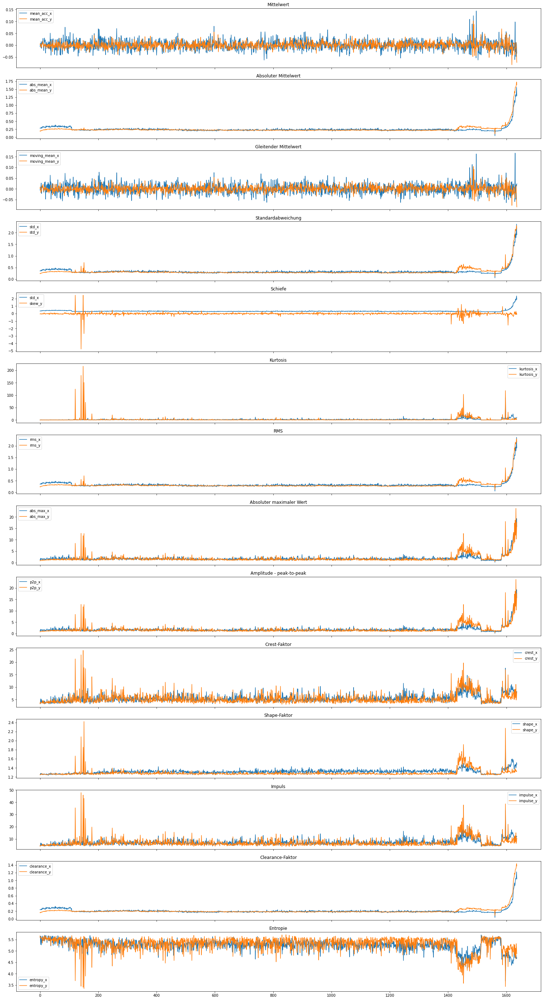

In [78]:
plot_signal_params(data, figsize=(26, 50))

<h5>Bearing 3_3 (Testset)</h5>

In [79]:
file = os.path.join(path, 'Test_set', 'Bearing3_3')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing3_3'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 23.20743203163147

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y  moving_mean_x  \
count  352.000000  352.000000  352.000000  352.000000     352.000000   
mean    -0.001339    0.001153    0.218218    0.314970      -0.001734   
std      0.039234    0.020917    0.041954    0.083684       0.040507   
min     -0.127345   -0.090010    0.166369    0.229408      -0.132639   
25%     -0.024277   -0.010300    0.194667    0.271070      -0.026695   
50%     -0.002682    0.001817    0.206600    0.292713      -0.003111   
75%      0.026421    0.015467    0.224904    0.320665       0.026287   
max      0.122324    0.087431    0.408488    0.687730       0.136619   

       moving_mean_y       std_x       std_y      skew_x      skew_y  ...  \
count     352.000000  352.000000  352.000000  352.000000  352.000000  ...   
mean        0.000812    0.274524    0.400398   -0.020099    0.012146  ...   
std         0.021751    0.054189    0.116803    0.061262    0.049823  ...   
min 

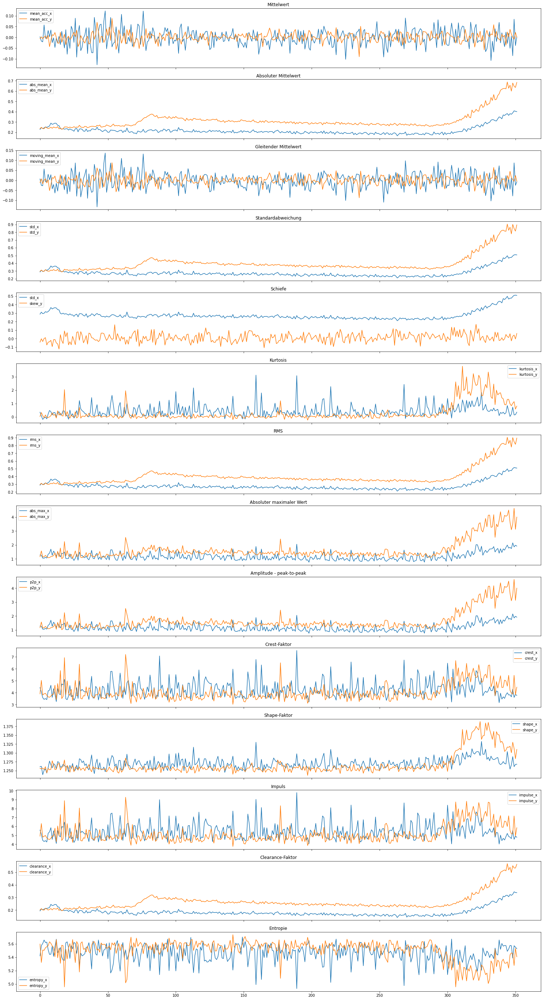

In [80]:
plot_signal_params(data, figsize=(26, 50))